In [1]:
from Loader_17 import DAVIS_Rawset, normalize
from deform_video import (
    DAVIS_withPoint,
    IMGPositionEmbeddingSine,
    PositionalEncoding,
    get_valid_ratio,
    MLP,
)
from deform_model import (
    DeformableTransformerDecoderLayer,
    DeformableTransformerDecoder,
    get_batch_average_bou_iou,
    add_mid_points,
)
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.optim import Adam
from einops import rearrange, repeat, reduce
import numpy as np
import torch.nn.functional as F
import gc
from polygon import SoftPolygon, RasLoss
import random
from tqdm import tqdm
from cotracker import DAVIS_Video, VideoLoss

In [1]:
!nvidia-smi

Tue Nov 19 21:41:39 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 565.57.01              Driver Version: 565.57.01      CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-PCIE-40GB          On  |   00000000:37:00.0 Off |                    0 |
| N/A   75C    P0            235W /  250W |    3915MiB /  40960MiB |     85%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
# train_raw_set = DAVIS_Rawset(is_train=True)

In [3]:
val_raw_set = DAVIS_Rawset(is_train=False)

In [5]:
val_point_set = DAVIS_withPoint(val_raw_set, 32, is_train=False)

In [6]:
point_batch = torch.stack([val_point_set.raw_data_set[0][i][2] for i in range(32)], dim=0)
point_batch.shape

torch.Size([32, 32, 2])

In [7]:
gt_rasterizer = SoftPolygon(1, "hard_mask").cuda()
ras_loss = RasLoss().cuda()

In [8]:
def get_batch_highest_point(point_batch):
    result = torch.zeros((point_batch.shape[0], 2)).to(point_batch.device)
    _, idx = torch.min(point_batch[:, :, 1], dim=1)
    result = point_batch[torch.arange(point_batch.shape[0]), idx]
    return result
    
def get_batch_4_extrame_points(point_batch: torch.Tensor):
    result = torch.zeros((point_batch.shape[0], 4, 2)).to(point_batch.device)
    # get the highest point
    _, idx = torch.min(point_batch[:, :, 1], dim=1)
    result[:, 0] = point_batch[torch.arange(point_batch.shape[0]), idx]
    # get the rightest point
    _, idx = torch.max(point_batch[:, :, 0], dim=1)
    result[:, 1] = point_batch[torch.arange(point_batch.shape[0]), idx]
    # get the lowest point
    _, idx = torch.max(point_batch[:, :, 1], dim=1)
    result[:, 2] = point_batch[torch.arange(point_batch.shape[0]), idx]
    # get the leftest point
    _, idx = torch.min(point_batch[:, :, 0], dim=1)
    result[:, 3] = point_batch[torch.arange(point_batch.shape[0]), idx]
    return result


total_extrame_points = get_batch_4_extrame_points(point_batch)
total_extrame_points.shape

torch.Size([32, 4, 2])

tensor(0.8731, device='cuda:0')


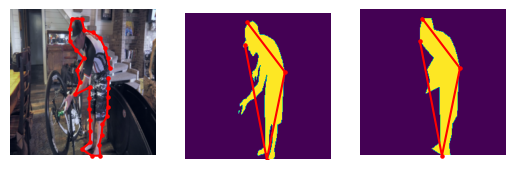

In [9]:
video_idx = 0
frame_idx = 12
img, mask, point = val_point_set.raw_data_set[video_idx][frame_idx]
poly_mask = gt_rasterizer(point.unsqueeze(0).cuda(), 224, 224)
plt.subplot(1, 3, 1)
plt.axis("off")
plt.imshow(normalize(img).permute(1, 2, 0))
plt.plot(point[:, 0], point[:, 1], c="r")
plt.scatter(point[:, 0], point[:, 1], c="r", s=5)
plt.subplot(1, 3, 2)
extrame_4_points = total_extrame_points[frame_idx]
plt.scatter(extrame_4_points[:, 0], extrame_4_points[:, 1], c="r", s=5)
plt.plot(extrame_4_points[:, 0], extrame_4_points[:, 1], c="r")
plt.axis("off")
plt.imshow(mask)
plt.subplot(1, 3, 3)
plt.axis("off")
plt.imshow(poly_mask[0].cpu().detach().numpy())
extrame_4_points = get_batch_4_extrame_points(point.unsqueeze(0))
plt.scatter(extrame_4_points[0, :, 0], extrame_4_points[0, :, 1], c="r", s=5)
plt.plot(extrame_4_points[0, :, 0], extrame_4_points[0, :, 1], c="r")
print(
    get_batch_average_bou_iou(
        point.unsqueeze(0).cuda(),
        mask.unsqueeze(0).cuda(),
        gt_rasterizer,
    )
)

In [10]:
val_video_set = DAVIS_Video(val_point_set.raw_data_set, 10)

In [11]:
val_loader = DataLoader(val_video_set, batch_size=1, shuffle=False)

In [12]:
imgs, masks, points = next(iter(val_loader))
imgs.shape, masks.shape, points.shape

(torch.Size([1, 10, 3, 224, 224]),
 torch.Size([1, 10, 224, 224]),
 torch.Size([1, 10, 32, 2]))

In [13]:
class CotrackerIter(nn.Module):
    def __init__(
        self,
        point_num: int,
        up_iter_num: int = 3,
        refine_iter: int = 3,
        freeze_featup: bool = True,
        d_model: int = 256,
        n_heads: int = 8,
        n_points: int = 9,
        d_ffn: int = 1024,
    ):
        super(CotrackerIter, self).__init__()
        self.refine_iter = refine_iter
        self.up_iter_num = up_iter_num
        self.featup = torch.hub.load(
            "mhamilton723/FeatUp",
            "dino16",
            use_norm=True,
        )
        if freeze_featup:
            for param in self.featup.parameters():
                param.requires_grad = False
        d_featup = 384
        if d_featup != d_model:
            self.featup_fc = nn.Linear(d_featup, d_model)
        else:
            self.featup_fc = nn.Identity()
        self.medium_level_size = [28, 56, 112]
        n_levels = len(self.medium_level_size) + 1
        n_layers = 1
        self.offset_ratio = 0.2
        self.pos_2d = IMGPositionEmbeddingSine(d_model)
        self.pos_1d = PositionalEncoding(d_model)
        self.level_pos = nn.Embedding(n_levels, d_model)
        nn.init.xavier_uniform_(self.level_pos.weight)

        self.query_embed = nn.Embedding(point_num, d_model)
        nn.init.xavier_uniform_(self.query_embed.weight)
        dec_layer = DeformableTransformerDecoderLayer(
            d_model=d_model,
            d_ffn=d_ffn,
            n_levels=n_levels,
            n_heads=n_heads,
            n_points=n_points,
        )
        self.def_dec_layernorm = nn.LayerNorm(d_model)
        self.def_decoder = DeformableTransformerDecoder(
            decoder_layer=dec_layer,
            num_layers=n_layers,
        )
        self.fir_layernorm = nn.LayerNorm(d_model)
        self.fir_encoder = nn.TransformerEncoder(
            encoder_layer=nn.TransformerEncoderLayer(
                d_model,
                n_heads,
                d_ffn,
                batch_first=True,
            ),
            num_layers=1,
        )
        self.other_layernorm = nn.LayerNorm(d_model)
        self.other_decoder = nn.TransformerDecoder(
            decoder_layer=nn.TransformerDecoderLayer(
                d_model,
                n_heads,
                d_ffn,
                batch_first=True,
            ),
            num_layers=1,
        )
        self.delta_xy_fc = MLP(d_model, d_model, 2, 3)
        self.delta_query_fc = MLP(d_model, d_model, d_model, 3)

    def forward(self, imgs: torch.Tensor, points: torch.Tensor):
        batch_size, frame_num, _, img_h, img_w = imgs.shape
        _, _, point_num, _ = points.shape

        points = points / 224.0

        fir_img = imgs[:, 0]
        fir_points = points[:, 0]
        (
            fir_src_flatten,
            fir_spatial_shapes,
            fir_level_start_index,
            fir_valid_ratios,
            fir_pos_embed_flatten,
        ) = self._get_img_scrs(fir_img, self.def_dec_layernorm)
        fir_src_flatten += fir_pos_embed_flatten
        fir_query_embed = repeat(self.query_embed.weight, "p d -> b p d", b=batch_size)
        fir_point_feats, _ = self.def_decoder(
            fir_query_embed,
            fir_points,
            fir_src_flatten,
            fir_spatial_shapes,
            fir_level_start_index,
            fir_valid_ratios,
        )
        fir_point_feats = self.fir_layernorm(fir_point_feats)
        fir_query = self.pos_1d(fir_point_feats)
        fir_memory = self.fir_encoder(fir_query)

        other_imgs = imgs[:, 1:]
        fir_extrame_points = get_batch_4_extrame_points(fir_points)
        # expand the extrame points to the other frames
        other_points = repeat(fir_extrame_points, "b p d -> b f p d", f=frame_num - 1)
        other_imgs = rearrange(other_imgs, "b f c h w -> (b f) c h w")
        other_points = rearrange(other_points, "b f p d -> (b f) p d")
        (
            other_src_flatten,
            other_spatial_shapes,
            other_level_start_index,
            other_valid_ratios,
            other_pos_embed_flatten,
        ) = self._get_img_scrs(other_imgs, self.def_dec_layernorm)
        other_src_flatten += other_pos_embed_flatten
        cur_point_num = other_points.shape[1]
        total_queries = repeat(
            self.query_embed.weight, "p d -> b p d", b=batch_size * (frame_num - 1)
        )
        cur_queries = total_queries[:, :cur_point_num]

        output_coords = []
        for i in range(self.up_iter_num + 1):
            tmp_coords = []
            for j in range(self.refine_iter):
                other_point_feats, _ = self.def_decoder(
                    cur_queries,
                    other_points,
                    other_src_flatten,
                    other_spatial_shapes,
                    other_level_start_index,
                    other_valid_ratios,
                )
                other_point_queries = rearrange(
                    other_point_feats, "(b f)p d -> b (f p) d", f=frame_num - 1
                )
                other_point_queries = self.other_layernorm(other_point_queries)
                other_point_queries = self.pos_1d(other_point_queries)
                other_point_queries = self.other_decoder(
                    tgt=other_point_queries,
                    memory=fir_memory,
                )
                other_point_queries = rearrange(
                    other_point_queries, "b (f p) d -> (b f) p d", f=frame_num - 1
                )
                delta_xy = self.delta_xy_fc(other_point_queries)
                delta_xy = (delta_xy.sigmoid() - 0.5) * self.offset_ratio
                other_points = other_points + delta_xy
                tmp_result = rearrange(
                    other_points, "(b f) p d -> b f p d", b=batch_size, f=frame_num - 1
                )
                tmp_coords.append(tmp_result)
                delta_query = self.delta_query_fc(other_point_feats)
                cur_queries = cur_queries + delta_query
            tmp_coords = torch.stack(tmp_coords, 1) * 224.0
            output_coords.append(tmp_coords)

            if i == self.up_iter_num:
                break
            # add new mid points
            other_points = add_mid_points(other_points)
            new_qeuries = total_queries[:, cur_point_num : cur_point_num * 2]
            cur_point_num = cur_point_num * 2
            old_queries = cur_queries
            cur_queries = torch.zeros(
                (
                    cur_queries.shape[0],
                    cur_point_num,
                    cur_queries.shape[2],
                )
            ).cuda()

            cur_queries[:, ::2] = new_qeuries
            cur_queries[:, 1::2] = old_queries

        return output_coords

    def _get_img_scrs(self, img: torch.Tensor, layernorm: nn.LayerNorm):
        b, c, h, w = img.shape
        feats = self.featup(img)
        feats = rearrange(feats, "b c h w -> b (h w) c")
        feats = self.featup_fc(feats)
        feats = rearrange(feats, "b (h w) c -> b c h w", h=h, w=w)
        srcs = []
        padding_masks = []
        pos_embeds = []
        for low_res in self.medium_level_size:
            srcs.append(
                F.interpolate(
                    feats,
                    size=(low_res, low_res),
                    mode="bilinear",
                ),
            )
        srcs.append(feats)
        for src in srcs:
            padding_masks.append(torch.zeros_like(src[:, 0:1, :, :]).squeeze(1).bool())
            pos_embeds.append(self.pos_2d(src, padding_masks[-1]))
        src_flatten = []
        spatial_shapes = []
        pos_embed_flatten = []

        for lvl, (src, pos) in enumerate(zip(srcs, pos_embeds)):
            src_flatten.append(
                rearrange(src, "b c h w -> b (h w) c"),
            )
            spatial_shapes.append(src.shape[-2:])
            pos = rearrange(pos, "b c h w -> b (h w) c")
            pos = self.level_pos.weight[lvl].view(1, 1, -1) + pos
            pos_embed_flatten.append(pos)

        level_start_index = torch.cat(
            (
                torch.tensor([0]),
                torch.cumsum(
                    torch.tensor([x.shape[1] for x in src_flatten]),
                    0,
                )[:-1],
            )
        ).cuda()
        src_flatten = torch.cat(src_flatten, 1).cuda()
        pos_embed_flatten = torch.cat(pos_embed_flatten, 1).cuda()
        valid_ratios = torch.stack(
            [get_valid_ratio(mask) for mask in padding_masks],
            1,
        ).cuda()
        spatial_shapes = torch.as_tensor(
            spatial_shapes,
            dtype=torch.long,
            device=src_flatten.device,
        )
        src_flatten = layernorm(src_flatten)

        return (
            src_flatten,
            spatial_shapes,
            level_start_index,
            valid_ratios,
            pos_embed_flatten,
        )


model = CotrackerIter(32).cuda()
with torch.no_grad():
    output_coords = model(imgs.cuda(), points.cuda())
    for i in range(len(output_coords)):
        print(output_coords[i].shape)

Using cache found in /zhome/32/f/202284/.cache/torch/hub/mhamilton723_FeatUp_main
Using cache found in /zhome/32/f/202284/.cache/torch/hub/facebookresearch_dino_main
/work3/s232248/miniconda3/envs/rd/lib/python3.11/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


torch.Size([1, 3, 9, 4, 2])
torch.Size([1, 3, 9, 8, 2])
torch.Size([1, 3, 9, 16, 2])
torch.Size([1, 3, 9, 32, 2])


In [14]:
class IterVideoLoss(nn.Module):
    def __init__(self, ras_loss: RasLoss, gt_rasterizer: SoftPolygon):
        super(IterVideoLoss, self).__init__()
        self.video_loss = VideoLoss(ras_loss, gt_rasterizer)

    def forward(self, pred_points: torch.Tensor, gt_masks: torch.Tensor):
        avg_loss = 0
        last_iou = 0
        for i in range(len(pred_points)):
            loss, iou = self.video_loss(pred_points[i], gt_masks)
            avg_loss += loss
            last_iou = iou
        return avg_loss, last_iou

iter_video_loss = IterVideoLoss(ras_loss, gt_rasterizer).cuda()
pred_points = model(imgs.cuda(), points.cuda())
loss, iou = iter_video_loss(pred_points, masks[:, 1:].cuda())
loss, iou


(tensor(1.7461, device='cuda:0', grad_fn=<AddBackward0>),
 tensor(0.3462, device='cuda:0'))

In [15]:
optimizer = Adam(model.parameters(), lr=1e-4)

In [29]:
val_video_set = DAVIS_Video(val_point_set.raw_data_set, 10, [22], is_eval=True, use_fir_point=True)
val_video_loader = DataLoader(val_video_set, batch_size=1, shuffle=False)

In [ ]:
loss_dict = {}
iou_dict = {}
epoch_num = 100

In [31]:
for e in range(epoch_num):
    total_loss = 0
    total_iou = 0
    for imgs, masks, points in val_video_loader:
        optimizer.zero_grad()
        pred_points = model(imgs.cuda(), points.cuda())
        loss, iou = iter_video_loss(pred_points, masks[:, 1:].cuda())
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        total_iou += iou
    loss_dict[e] = total_loss / len(val_video_loader)
    iou_dict[e] = total_iou / len(val_video_loader)
    print(f"Epoch {e}, loss: {loss_dict[e]:.4f}, iou: {iou_dict[e]:.4f}")

Epoch 0, loss: 2.6570, iou: 0.1804
Epoch 1, loss: 2.2898, iou: 0.1914
Epoch 2, loss: 2.1981, iou: 0.1921
Epoch 3, loss: 1.7684, iou: 0.4102
Epoch 4, loss: 1.8065, iou: 0.3828
Epoch 5, loss: 1.6077, iou: 0.4184
Epoch 6, loss: 1.5125, iou: 0.3929
Epoch 7, loss: 1.5200, iou: 0.3784
Epoch 8, loss: 1.3322, iou: 0.4985
Epoch 9, loss: 1.3398, iou: 0.5011
Epoch 10, loss: 1.3166, iou: 0.5067
Epoch 11, loss: 1.2507, iou: 0.5532
Epoch 12, loss: 1.2438, iou: 0.5486
Epoch 13, loss: 1.2011, iou: 0.5576
Epoch 14, loss: 1.1203, iou: 0.5810
Epoch 15, loss: 1.0990, iou: 0.5892
Epoch 16, loss: 1.1052, iou: 0.5737
Epoch 17, loss: 1.0100, iou: 0.6378
Epoch 18, loss: 0.9927, iou: 0.6486
Epoch 19, loss: 0.9921, iou: 0.6592
Epoch 20, loss: 0.9499, iou: 0.6749
Epoch 21, loss: 0.9581, iou: 0.6542
Epoch 22, loss: 0.9305, iou: 0.6657
Epoch 23, loss: 0.9142, iou: 0.6805
Epoch 24, loss: 0.9100, iou: 0.6750
Epoch 25, loss: 0.8886, iou: 0.6887
Epoch 26, loss: 0.8859, iou: 0.6760
Epoch 27, loss: 0.8553, iou: 0.7004
Ep

In [32]:
pred_points = model(imgs.cuda(), points.cuda())
for i in range(len(pred_points)):
    print(pred_points[i].shape)

torch.Size([1, 3, 9, 4, 2])
torch.Size([1, 3, 9, 8, 2])
torch.Size([1, 3, 9, 16, 2])
torch.Size([1, 3, 9, 32, 2])


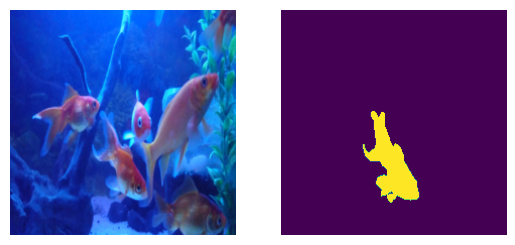

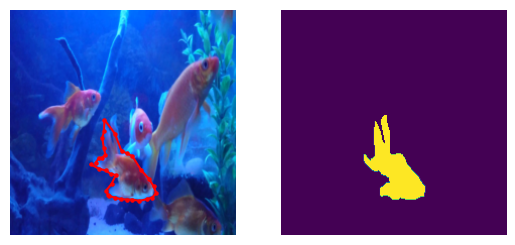

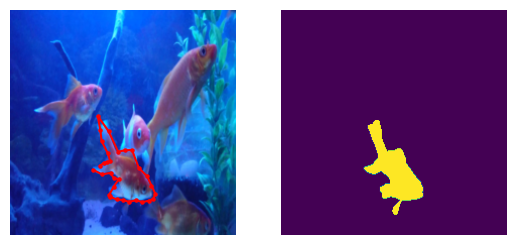

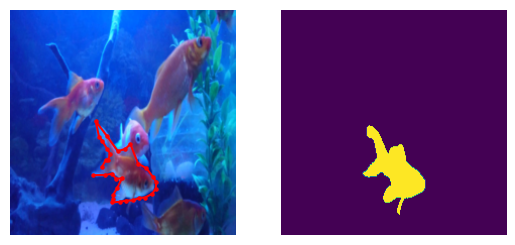

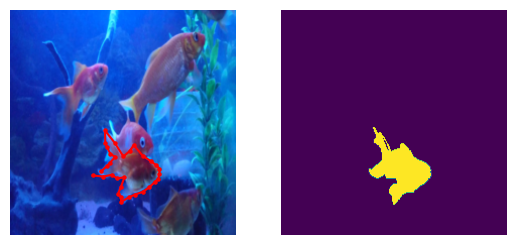

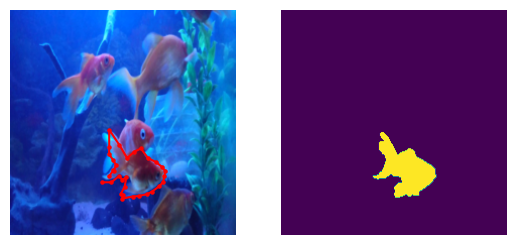

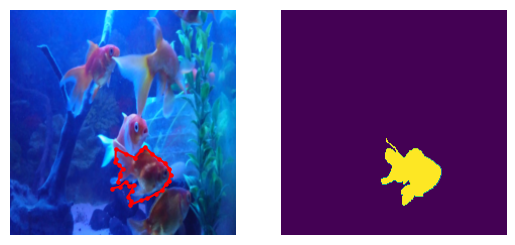

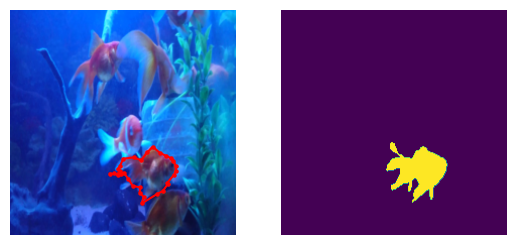

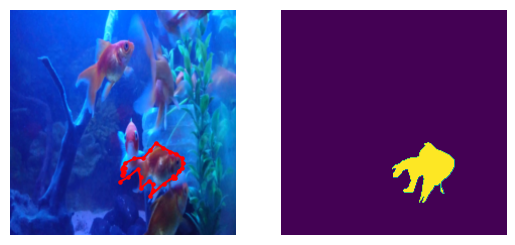

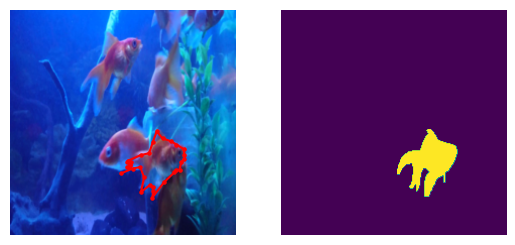

In [33]:
point_num_idx = 3
for i in range(len(imgs[0])):
    plt.subplot(1, 2, 1)
    plt.axis("off")
    plt.imshow(normalize(imgs[0, i]).permute(1, 2, 0))
    if i != 0:
        pred_point = pred_points[point_num_idx][0][-1][i - 1].detach().cpu().numpy()
        plt.scatter(pred_point[:, 0], pred_point[:, 1], c="r", s=5)
        plt.plot(pred_point[:, 0], pred_point[:, 1], c="r")
    plt.subplot(1, 2, 2)
    plt.axis("off")
    plt.imshow(masks[0, i].cpu().numpy())
    plt.show()


In [38]:
class CoEvalerIter:
    def __init__(
        self,
        raw_set: list[list[tuple[torch.Tensor, torch.Tensor, torch.Tensor]]],
        gt_rasterizer: SoftPolygon,
        frame_num: int = 10,
    ):
        self.raw_set = raw_set
        self.frame_num = frame_num
        self.gt_rasterizer = gt_rasterizer
        self.total_pred_results = []

    def eval_one_video(self, video_idx: int, model: CotrackerIter):
        video_data = self.raw_set[video_idx]
        total_frame_num = len(video_data)
        img_list = []
        mask_list = []
        point_list = []
        for frame_idx in range(total_frame_num):
            img, mask, point = video_data[frame_idx]
            img_list.append(img)
            mask_list.append(mask)
            point_list.append(point)
        total_masks = torch.stack(mask_list)
        total_points = torch.stack(point_list)
        total_pred_points = torch.zeros_like(total_points)
        total_pred_points[0] = total_points[0]
        interval = (total_frame_num - 1) // (self.frame_num - 1)
        offset_min = -(interval - 1)
        offset_max = (total_frame_num - 1) - (self.frame_num - 1) * interval
        done_idx_list = [0]
        for offset in range(offset_min, offset_max + 1):
            selected_frame_idxs = [0]
            for i in range(1, self.frame_num):
                selected_frame_idxs.append(i * interval + offset)
            selected_frame_idxs = sorted(selected_frame_idxs)
            img_list = []
            mask_list = []
            point_list = []
            fir_point = video_data[0][2]
            for frame_idx in selected_frame_idxs:
                img, mask, point = video_data[frame_idx]
                img_list.append(img)
                mask_list.append(mask)
                point_list.append(fir_point)
            imgs = torch.stack(img_list).unsqueeze(0)
            masks = torch.stack(mask_list).unsqueeze(0)
            points = torch.stack(point_list).unsqueeze(0)
            with torch.no_grad():
                model.eval()
                pred_points = model(imgs.cuda(), points.cuda())[-1]
                pred_points = pred_points.clamp(0, 223)
            pred_points = pred_points[0][-1]
            for result_idx, frame_idx in enumerate(selected_frame_idxs[1:]):
                if frame_idx in done_idx_list:
                    continue
                done_idx_list.append(frame_idx)
                total_pred_points[frame_idx] = pred_points[result_idx]
        total_iou = get_batch_average_bou_iou(
            total_pred_points.cuda(),
            total_masks.cuda(),
            self.gt_rasterizer,
        )
        return total_iou, total_pred_points

    def compute_avg_iou(self):
        iou_list = [iou for iou, _ in self.total_pred_results]
        return sum(iou_list) / len(iou_list)

    def eval_all_video(self, model: CotrackerIter, use_tqdm=False):
        self.total_pred_results = []
        video_num = len(self.raw_set)
        if use_tqdm:
            video_idx_list = tqdm(range(video_num))
        else:
            video_idx_list = range(video_num)
        for video_idx in video_idx_list:
            iou, pred_points = self.eval_one_video(video_idx, model)
            self.total_pred_results.append((iou, pred_points))
        return self.compute_avg_iou()

    def show_iou_distribution(self):
        iou_list = [iou.item() for iou, _ in self.total_pred_results]
        plt.hist(iou_list, bins=20)
        plt.show()

    def show_video_result(
        self,
        video_idx: int,
        gt_rasterizer: SoftPolygon,
        img_per_line=5,
        mask_alpha=0.2,
    ):
        video_data = self.raw_set[video_idx]
        frame_num = len(video_data)
        line_num = (frame_num - 1) // img_per_line + 1
        total_pred_points = self.total_pred_results[video_idx][1]
        plt.figure(figsize=(img_per_line * 4, line_num * 4))
        for i, pred_point in enumerate(total_pred_points):
            plt.subplot(line_num, img_per_line, i + 1)
            plt.axis("off")
            img, mask, point = video_data[i]
            plt.imshow(normalize(img).permute(1, 2, 0))
            iou = get_batch_average_bou_iou(
                pred_point.unsqueeze(0).cuda(), mask.unsqueeze(0).cuda(), gt_rasterizer
            ).item()
            plt.title(f"IoU: {iou:.4f}")
            plt.scatter(pred_point[:, 0], pred_point[:, 1], c="r", s=5)
            plt.plot(pred_point[:, 0], pred_point[:, 1], c="r")
            plt.imshow(mask, alpha=mask_alpha)
        plt.show()

coevaler_iter = CoEvalerIter(val_point_set.raw_data_set, gt_rasterizer, 10)
iou, pred_points = coevaler_iter.eval_one_video(22, model)

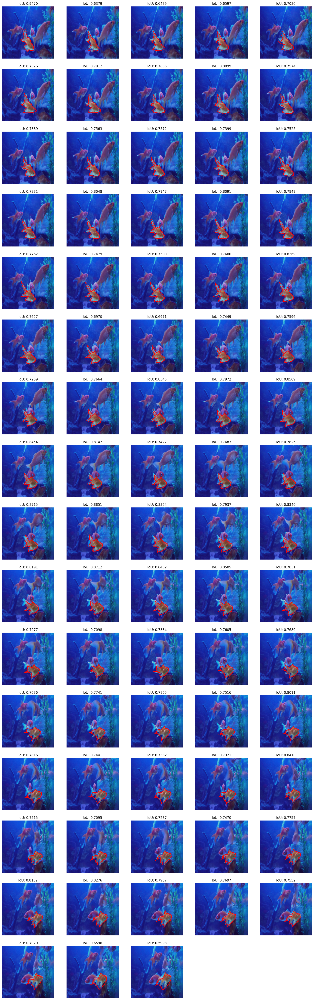

In [40]:
video_idx = 22
img_per_line = 5
mask_alpha = 0.2
video_data = coevaler_iter.raw_set[video_idx]
frame_num = len(video_data)
line_num = frame_num // img_per_line + 1
plt.figure(figsize=(20, 4 * line_num))
for i, pred_point in enumerate(pred_points):
    plt.subplot(line_num, img_per_line, i + 1)
    plt.axis("off")
    img, mask, point = video_data[i]
    plt.imshow(normalize(img).permute(1, 2, 0))
    iou = get_batch_average_bou_iou(pred_point.unsqueeze(0).cuda(), mask.unsqueeze(0).cuda(), gt_rasterizer).item()
    plt.title(f"IoU: {iou:.4f}")
    plt.scatter(pred_point[:, 0], pred_point[:, 1], c="r", s=5)
    plt.plot(pred_point[:, 0], pred_point[:, 1], c="r")
    plt.imshow(mask, alpha=mask_alpha)

In [35]:
gc.collect()
torch.cuda.empty_cache()